# Auswertung Semantischer Wandel

Schritte
- Wortlisten mit Scores laden
- Graphen
    - Boxplot über Verteilung
- Ansonsten:
    - Was sind die Worte mit dem höchsten Wandel
    - Was sind die Worte mit dem niedrigsten Wandel

In [1]:
# Epik

import pandas as pd

epik_fasttext = pd.read_csv("semantic_change_results/fasttext_semantic_change_list_epik.csv", header=0)
epik_fasttext.head()

,word,score
0,verworfen,0.13
1,unterlassen,0.12
2,schläfer,0.19
3,abschreckend,0.28
4,herabsunken,0.22


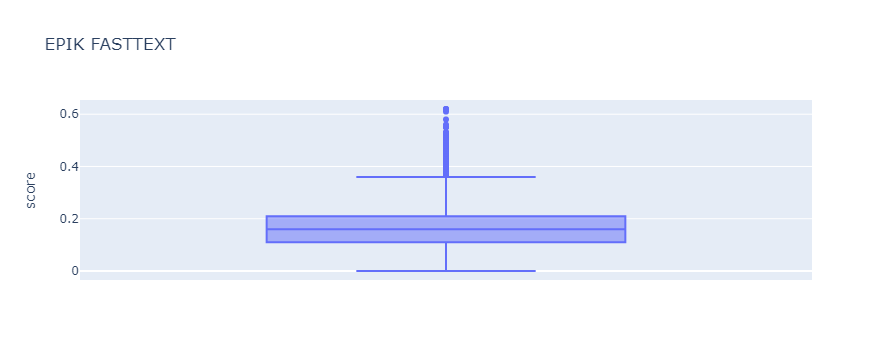

In [9]:
import plotly.express as px

fig = px.box(epik_fasttext,
             y = "score",
             hover_data = ["word"],
             title = "EPIK FASTTEXT")

fig.show()

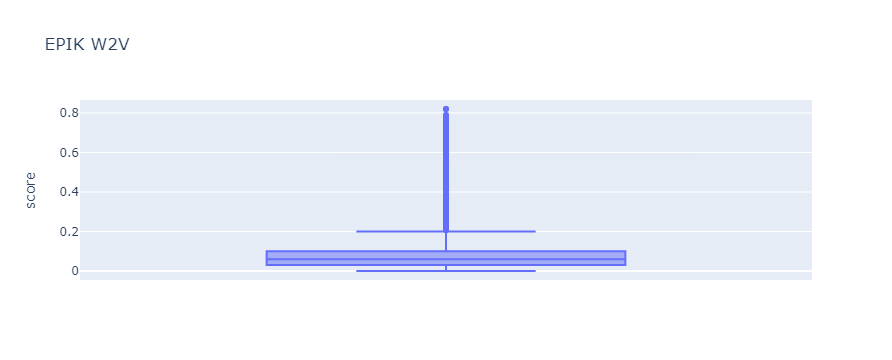

In [11]:
epik_w2v = pd.read_csv("semantic_change_results/word2vec_semantic_change_list_epik.csv", header=0)

fig = px.box(epik_w2v,
             y = "score",
             hover_data = ["word"],
             title = "EPIK W2V")

fig.show()

In [12]:
drama_fasttext = pd.read_csv("semantic_change_results/fasttext_semantic_change_list_drama.csv", header = 0)
lyrik_fasttext = pd.read_csv("semantic_change_results/fasttext_semantic_change_list_lyrik.csv", header = 0)
drama_w2v = pd.read_csv("semantic_change_results/word2vec_semantic_change_list_drama.csv", header = 0)
lyrik_w2v = pd.read_csv("semantic_change_results/word2vec_semantic_change_list_lyrik.csv", header = 0)

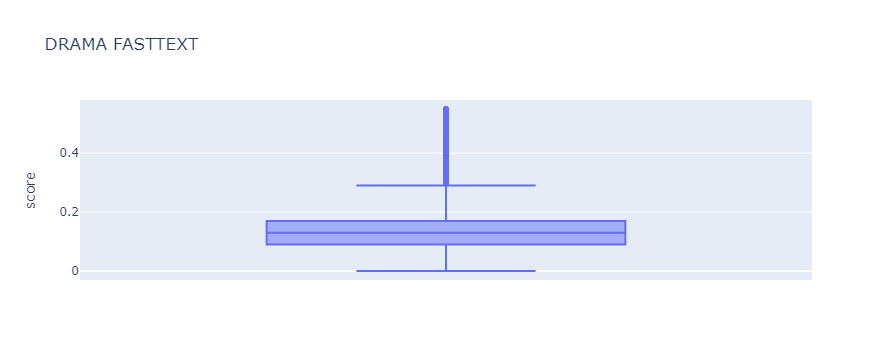

In [13]:
fig = px.box(drama_fasttext,
             y = "score",
             hover_data = ["word"],
             title = "DRAMA FASTTEXT")

fig.show()

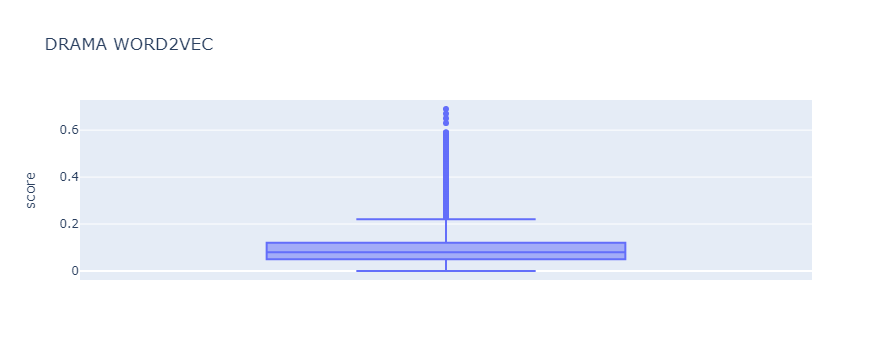

In [14]:
fig = px.box(drama_w2v,
             y = "score",
             hover_data = ["word"],
             title = "DRAMA WORD2VEC")

fig.show()

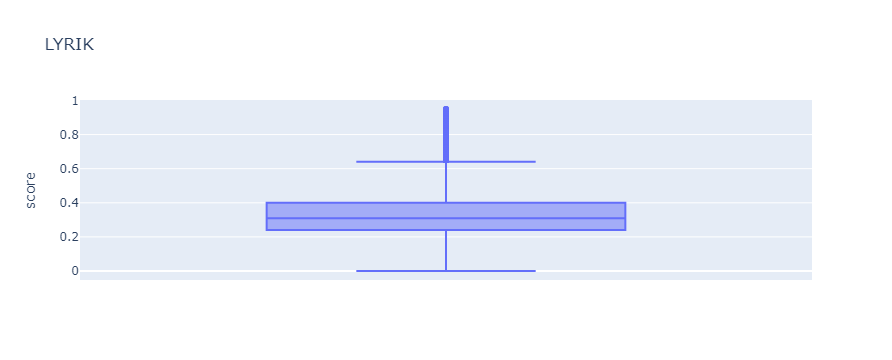

In [15]:
fig = px.box(lyrik_fasttext,
             y = "score",
             hover_data = ["word"],
             title = "LYRIK")

fig.show()

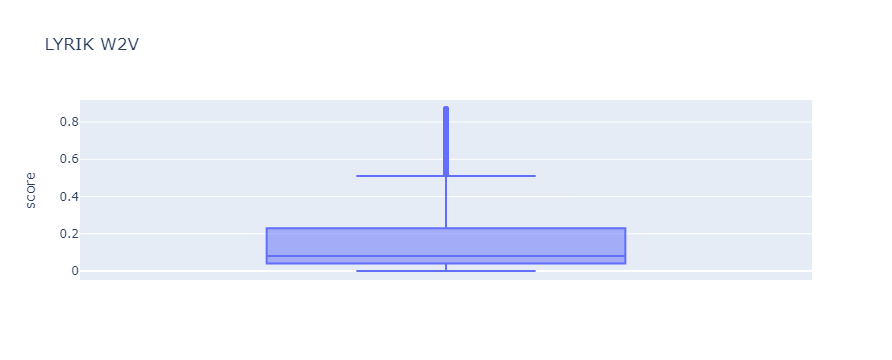

In [16]:
fig = px.box(lyrik_w2v,
             y = "score",
             hover_data = ["word"],
             title = "LYRIK W2V")

fig.show()

# Alle zusammen

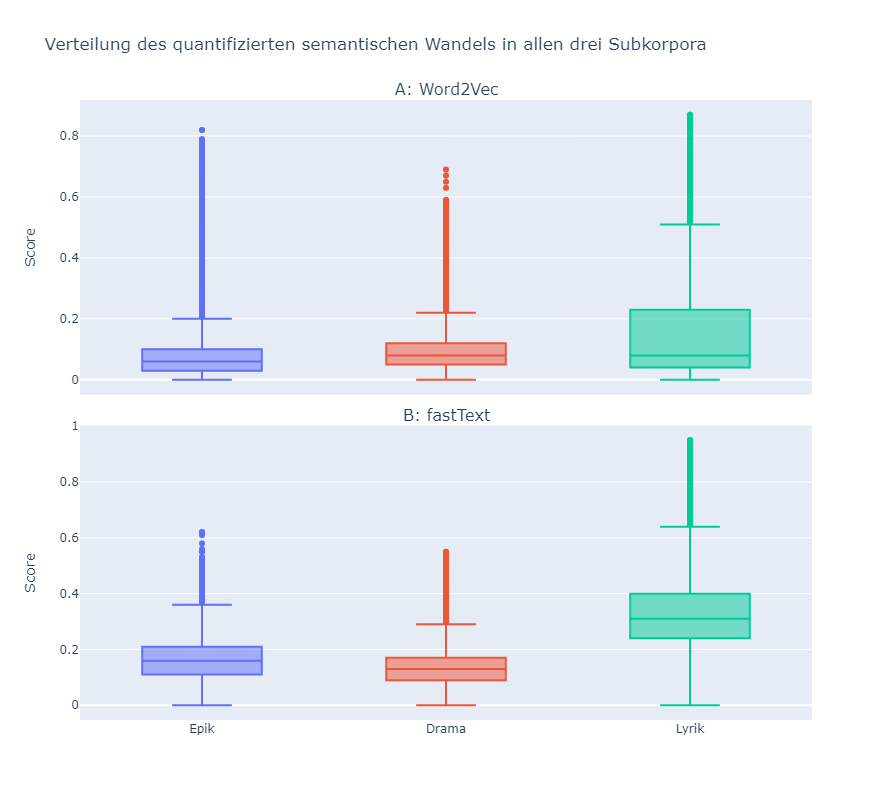

In [96]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1,
                   subplot_titles=("A: Word2Vec", "B: fastText"),
                   shared_xaxes=True,
                   vertical_spacing=0.05)

fig.add_trace(go.Box(
    y=epik_w2v["score"],
    name="Epik",
    marker_color="#636EFA"
    
),row=1, col=1)

fig.add_trace(go.Box(
    y= drama_w2v["score"],
    name="Drama",
    marker_color = "#EF553B"

),row=1, col=1)

fig.add_trace(go.Box(
    y=lyrik_w2v["score"],
    name="Lyrik",
    marker_color = "#00CC96"

),row=1, col=1)

fig.add_trace(go.Box(
    y=epik_fasttext["score"],
    name="Epik",
    marker_color="#636EFA"
    
),row=2, col=1)

fig.add_trace(go.Box(
    y= drama_fasttext["score"],
    name="Drama",
    marker_color = "#EF553B"

),row=2, col=1)

fig.add_trace(go.Box(
    y=lyrik_fasttext["score"],
    name="Lyrik",
    marker_color = "#00CC96"

),row=2, col=1)


fig.update_yaxes(title_text="Score", row=1, col=1)
fig.update_yaxes(title_text="Score", row=2, col=1)

fig.update_layout(title_text="Verteilung des quantifizierten semantischen Wandels in allen drei Subkorpora",
                  showlegend = False,
                  width=800,
                  height=800)
fig.show()

In [99]:
from scipy import stats

stats.ttest_ind(epik_w2v["score"],epik_fasttext["score"])

Ttest_indResult(statistic=-44.08950970012082, pvalue=0.0)

In [100]:
stats.ttest_ind(drama_w2v["score"], drama_fasttext["score"])

Ttest_indResult(statistic=-68.57578082384941, pvalue=0.0)

In [101]:
stats.ttest_ind(lyrik_w2v["score"], lyrik_fasttext["score"])

Ttest_indResult(statistic=-99.77053252208992, pvalue=0.0)